# Testes de hipótese 🔎

Quando fazemos um teste de hipótese, precisamos comparar duas ideias opostas:

- H₀ (hipótese nula) : é a ideia de que nada mudou, nada é diferente e não existe efeito.

- H₁ (hipótese alternativa): é a ideia que queremos testar: há diferença, há efeito, algo mudou.

Pense na hipótese nula como o “ponto de partida” e na alternativa como a “suspeita” que queremos confirmar. E você deve estar se perguntando, Por que existe a hipótese nula? *Porque na ciência, seguimos a lógica de que não assumimos mudanças sem provas*. Então, primeiro assumimos que nada aconteceu (H₀) e buscamos evidências suficientes nos dados para rejeitar essa ideia e aceitar que algo realmente mudou (H₁).

Todo teste retorna um valor-p (p-value) que nos direciona o resultado desse teste, onde:

- Se p-value é pequeno (geralmente menor que 0,05), significa que os dados observados **são muito improváveis se H₀ fosse verdadeira**, então rejeitamos H₀ e aceitamos H₁.

- Se p-value é grande, os dados não contradizem H₀, **então não rejeitamos H₀**.


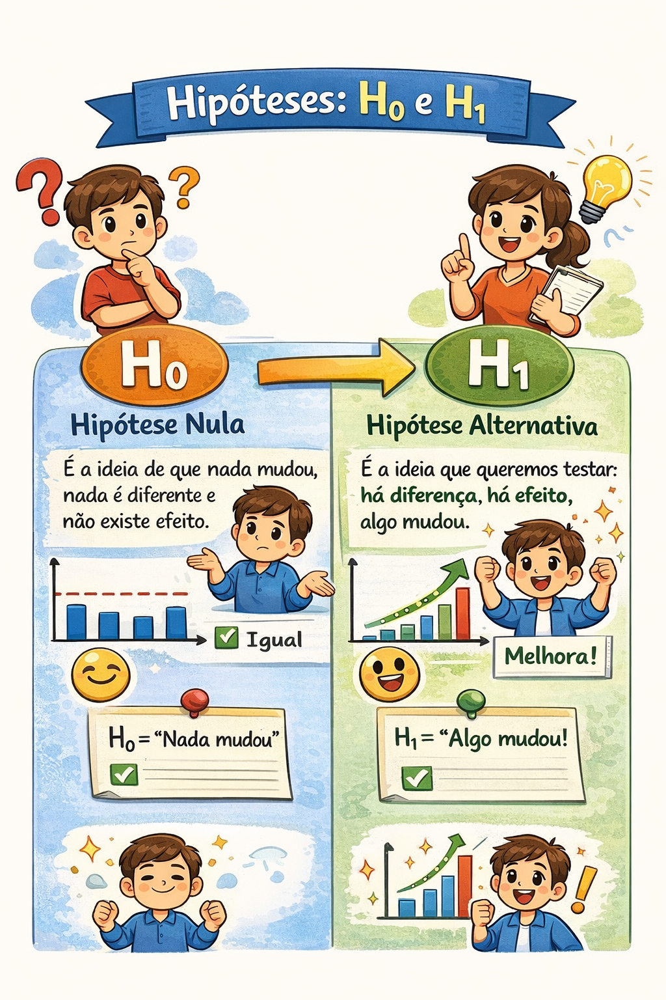

## Erros Tipo I e Tipo II

Os erros Tipo I e Tipo II acontecem porque testes de hipótese trabalham com probabilidade, não com certeza absoluta. Sempre existe algum risco de tirar uma conclusão errada porque estamos analisando amostras, não a população inteira.

### Como acontece o Erro Tipo I (falso positivo)?

O Erro Tipo I ocorre quando vemos um efeito que não existe.
Em outras palavras: o teste diz que há diferença, mas não há.

🔍 Por que isso acontece?

Porque, ao trabalhar com amostras, pode ocorrer uma flutuação aleatória nos dados — um acaso estatístico — que faz parecer que há diferença.

O nível de significância (α = 5%) significa exatamente isso:
➡️ mesmo quando não existe diferença, 5% das amostras podem sugerir uma diferença “por sorte”.

🎯 Exemplo claro

Você compara ticket médio antes e depois de uma campanha, mas por coincidência, a amostra depois pegou só clientes que gastaram mais naquele dia da semana.

O modelo detecta diferença, mas na verdade foi só sorte da amostragem.

### Como acontece o Erro Tipo II (falso negativo)?

O Erro Tipo II acontece quando não percebemos um efeito que realmente existe.
Ou seja: o teste diz que não há diferença, mas há.

🔍 Por que isso acontece?

Esse erro geralmente ocorre quando:

- A amostra é pequena demais.

- Há muita variabilidade nos dados (alta dispersão).

- O efeito real é fraco ou sutil.

- O teste escolhido tem pouco poder.

Como o teste precisa detectar um padrão, se a amostra for pequena ou ruidosa, ele pode não ter “força” suficiente para enxergar a diferença.

🎯 Exemplo claro

Uma atualização de produto realmente aumentou a satisfação dos usuários, mas você coletou poucas respostas.
A variabilidade das notas é grande, então o teste não detecta diferença.

Na prática, a diferença existe, mas a amostra não conseguiu mostrar isso.

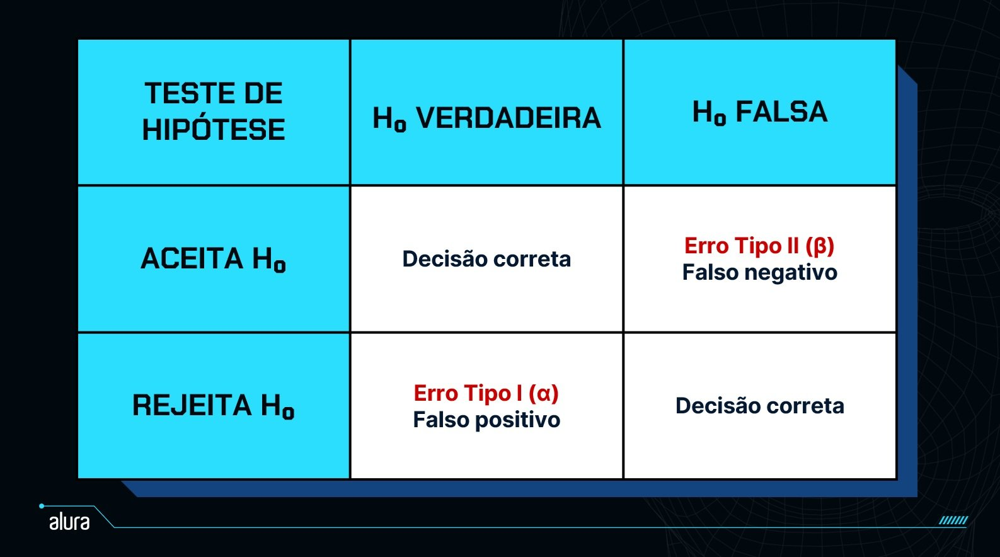

### Testes Paramétricos

São testes que dependem de pressupostos mais fortes sobre os dados, especialmente:

- A variável deve ser numérica contínua

- A distribuição deve ser normal (ou aproximadamente normal)

- As variâncias dos grupos devem ser semelhantes (em muitos casos)

- Usam médias e desvios-padrão como base da comparação

📌 Quando usar?
Quando você tem dados limpos, contínuos e que seguem uma distribuição estável e aproximadamente normal.

📌 Exemplos:

- Teste t (independente ou pareado)

- ANOVA

📌 Vantagem:
São mais poderosos quando as premissas são atendidas, detectam diferenças com mais sensibilidade.

📌 Desvantagem:
São sensíveis a outliers, assimetria e violações de normalidade.

### Testes Não Paramétricos

São testes que não dependem da normalidade e fazem menos suposições sobre os dados.

- Funcionam bem com dados assimétricos, com outliers ou escalas diferentes

- Podem ser usados com dados ordinais (ex.: notas 1 a 10)

- Baseiam-se em postos (ranks) em vez de médias

📌 Quando usar?
Quando os dados não são normais, têm muitos outliers ou são categorizados/ordinais.

📌 Exemplos:

- Mann-Whitney U (alternativa ao teste t)

- Wilcoxon (alternativa ao t pareado)

- Kruskal-Wallis (alternativa à ANOVA)

- Kolmogorov-Smirnov (compara distribuições completas)

📌 Vantagem:
São mais robustos, menos sensíveis a outliers e funcionam mesmo com distribuições “bagunçadas”.

📌 Desvantagem:
Costumam ser menos poderosos quando os dados são normais — podem precisar de amostras maiores para detectar diferenças.

# Parametrico

# **T de Student**

Utilizado para comparar médias.

Imagine que você quer saber se a última campanha de marketing aumentou o ticket médio dos clientes. Você coleta uma amostra de vendas antes e depois da campanha e compara as médias.

Se as duas amostras forem independentes, por exemplo, clientes diferentes antes e depois, você usa um teste t para duas amostras independentes. Agora, se forem os mesmos clientes comparados antes e depois, você usa o teste t pareado.

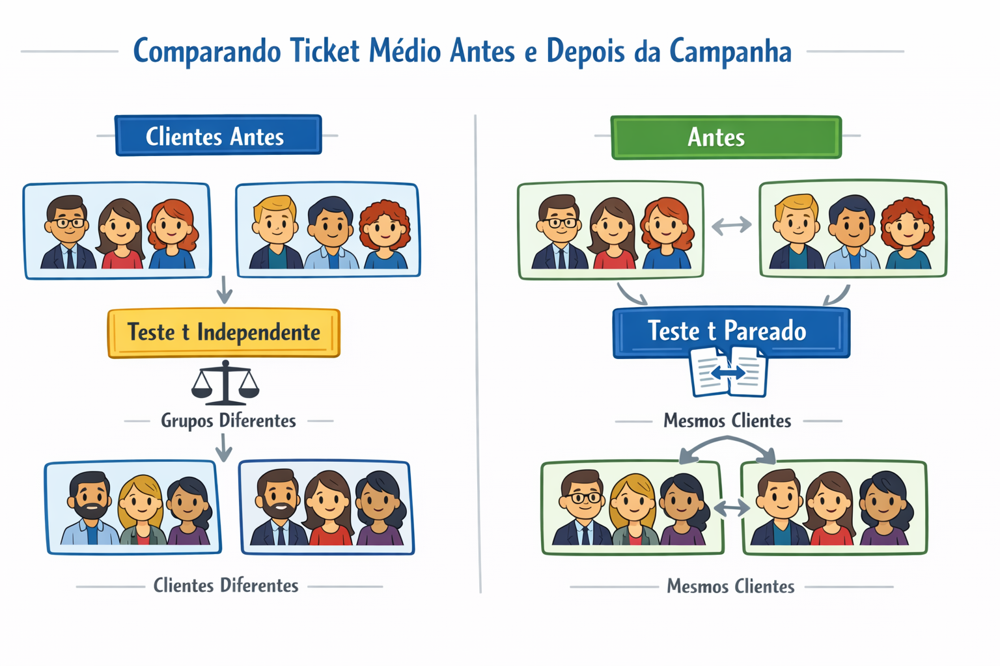

In [1]:
import numpy as np
import pandas as pd
from scipy import stats

In [2]:
df = pd.read_csv("case_teste_t_campanha.csv")

In [3]:
df.head()

,customer_id,period,ticket
0,1,before,202.384995
1,2,before,180.160749
2,3,before,207.669099
3,4,before,238.306045
4,5,before,176.804632


In [4]:
set(df['period'])

{'after_independent', 'after_paired', 'before'}

In [5]:
def interpretar_pvalue(p, alpha=0.05):
    if p < alpha:
        return f"p-value = {p:.4f} < {alpha}. Há evidência estatística para diferença significativa."
    else:
        return f"p-value = {p:.4f} >= {alpha}. NÃO há evidência estatística para diferença significativa."

In [6]:
before = df[df["period"] == "before"]["ticket"]
after_ind = df[df["period"] == "after_independent"]["ticket"]
after_paired = df[df["period"] == "after_paired"]["ticket"]

In [8]:
# Teste t para amostras independentes
# As médias desses dois grupos são estatisticamente diferentes?
t_ind, p_ind = stats.ttest_ind(before, after_ind)

# Teste t pareado
# A média da diferença entre antes e depois é diferente de zero?
t_pair, p_pair = stats.ttest_rel(before, after_paired)

print("Teste t independente")
print(f"t = {t_ind:.4f}")
print(interpretar_pvalue(p_ind))
print()

print("Teste t pareado")
print(f"t = {t_pair:.4f}")
print(interpretar_pvalue(p_pair))


Teste t independente
t = -4.8475
p-value = 0.0000 < 0.05. Há evidência estatística para diferença significativa.

Teste t pareado
t = -20.1083
p-value = 0.0000 < 0.05. Há evidência estatística para diferença significativa.


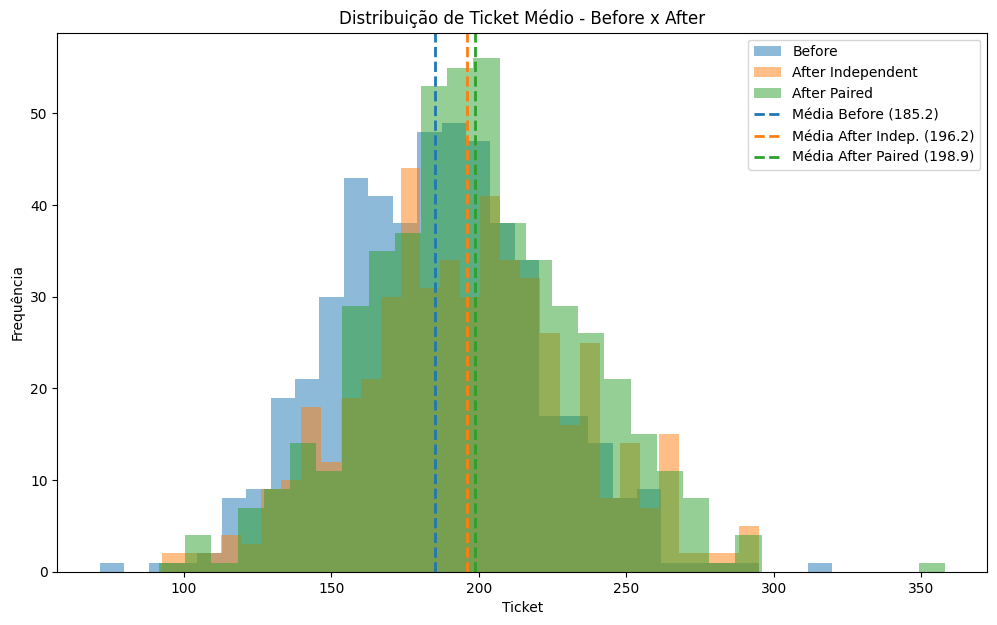

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,7))

# Cores escolhidas manualmente para manter consistência
color_before = "tab:blue"
color_after_ind = "tab:orange"
color_after_paired = "tab:green"

# Histogramas
plt.hist(before, bins=30, alpha=0.5, label="Before", color=color_before)
plt.hist(after_ind, bins=30, alpha=0.5, label="After Independent", color=color_after_ind)
plt.hist(after_paired, bins=30, alpha=0.5, label="After Paired", color=color_after_paired)

# Médias — agora com as mesmas cores dos histogramas
plt.axvline(before.mean(), linestyle="--", linewidth=2, color=color_before,
            label=f"Média Before ({before.mean():.1f})")

plt.axvline(after_ind.mean(), linestyle="--", linewidth=2, color=color_after_ind,
            label=f"Média After Indep. ({after_ind.mean():.1f})")

plt.axvline(after_paired.mean(), linestyle="--", linewidth=2, color=color_after_paired,
            label=f"Média After Paired ({after_paired.mean():.1f})")

plt.title("Distribuição de Ticket Médio - Before x After")
plt.xlabel("Ticket")
plt.ylabel("Frequência")
plt.legend()
plt.show()


Conclusão geral:
A campanha de marketing teve impacto real no ticket médio, tanto
quando analisamos clientes diferentes quanto quando analisamos os mesmos
clientes antes e depois. A evidência estatística é forte e consistente.

# **ANOVA**

É utilizada quando queremos comparar três ou mais grupos.

Suponha que você é analista de produto e quer entender se o NPS difere entre clientes das regiões Sul, Sudeste e Nordeste. Nesse caso, comparar média por média seria trabalhoso.

A ANOVA resolve o problema em um único passo estatístico. Se o teste indicar diferença significativa, você sabe que pelo menos um grupo é diferente dos demais.

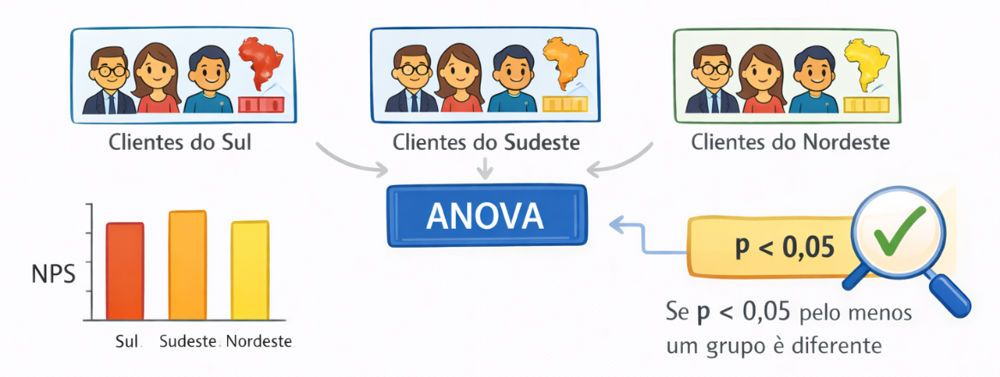

In [10]:
from scipy.stats import f_oneway

In [11]:
df_regioes = pd.read_csv("nps_regioes.csv")
df_regioes.head()

,region,nps
0,Sul,64.967142
1,Sul,58.617357
2,Sul,66.476885
3,Sul,75.230299
4,Sul,57.658466


In [12]:
def anova_teste(df, col_valor, col_grupo, alpha=0.05):
    # separa valores por grupo
    grupos = df[col_grupo].unique()
    listas_grupos = [df[df[col_grupo] == g][col_valor].dropna() for g in grupos]

    # executa ANOVA
    F, p = f_oneway(*listas_grupos)

    # interpretação
    if p < alpha:
        interpretacao = (
            f"Há diferença estatística entre os grupos (p = {p:.4f} < {alpha})."
        )
    else:
        interpretacao = (
            f"Não há diferença estatística entre os grupos (p = {p:.4f} ≥ {alpha})."
        )

    return {
        "F_estatistico": F, # O F_estatístico (ou estatística F) é o valor central do teste ANOVA
        "p_valor": p,       # É ele que mede se as médias dos grupos são diferentes entre si.
        "grupos_analisados": list(grupos),
        "interpretacao": interpretacao
    }

In [13]:
resultado = anova_teste(df_regioes, "nps", "region")
print(resultado)

{'F_estatistico': np.float64(14.13045431816722), 'p_valor': np.float64(1.373725297010562e-06), 'grupos_analisados': ['Sul', 'Sudeste', 'Nordeste'], 'interpretacao': 'Há diferença estatística entre os grupos (p = 0.0000 < 0.05).'}


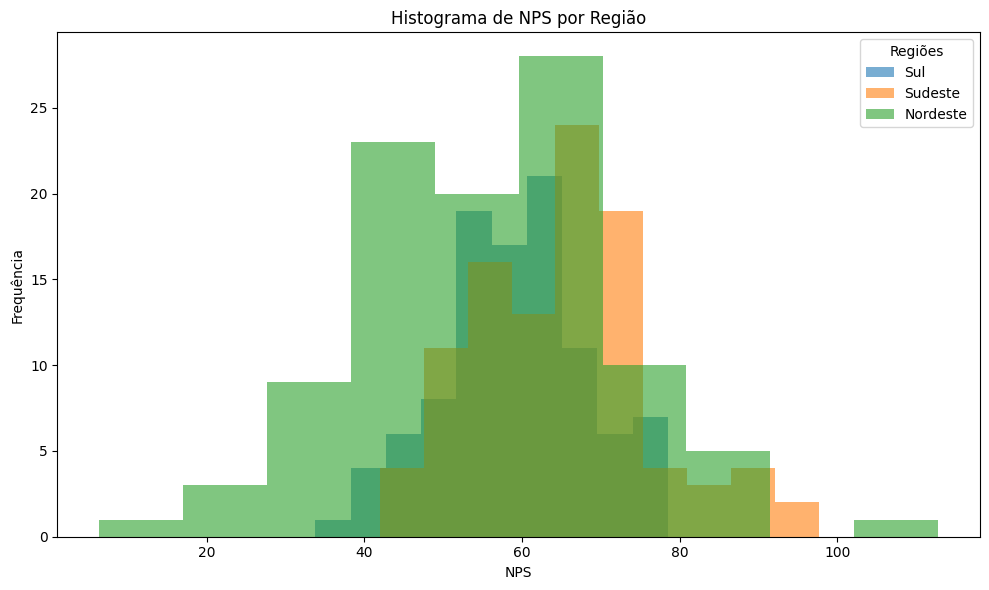

In [14]:
# Lista de regiões
regioes = df_regioes["region"].unique()

plt.figure(figsize=(10,6))

for regiao in regioes:
    subset = df_regioes[df_regioes["region"] == regiao]["nps"]
    plt.hist(subset, alpha=0.6, bins=10, label=regiao)

plt.xlabel("NPS")
plt.ylabel("Frequência")
plt.title("Histograma de NPS por Região")
plt.legend(title="Regiões")
plt.tight_layout()
plt.show()


Com base no teste ANOVA realizado para comparar os valores de NPS entre as regiões Sul, Sudeste e Nordeste, observamos o seguinte:

O p-valor obtido foi menor que 0,05, indicando que existe evidência estatística suficiente para rejeitar a hipótese nula.

Portanto, concluímos que pelo menos uma das regiões apresenta uma média de NPS significativamente diferente das demais.

# Não Paramétrico

# **Teste Qui-Quadrado**

Para variáveis categóricas, o teste não paramétrico mais importante é o Qui-Quadrado de Independência. Em ambientes de predição de churn, por exemplo, é muito comum verificar se há associação entre a variável “plano contratado” e “cancelamento”. O teste de Qui-Quadrado identifica se a distribuição de churn realmente muda conforme o plano, ou se tudo não passa de flutuação aleatória.




In [15]:
import pandas as pd
from scipy.stats import chi2_contingency

# Criando a tabela de contingência
dados = {
    "Cancelou": [120, 80, 30],
    "Nao_Cancelou": [380, 420, 170]
}

df_churn = pd.DataFrame(dados, index=["Basico", "Padrao", "Premium"])


In [16]:
df_churn.head()

,Cancelou,Nao_Cancelou
Basico,120,380
Padrao,80,420
Premium,30,170


In [17]:

# Executando o teste Qui-Quadrado
chi2, p, dof, expected = chi2_contingency(df_churn)

print("Qui-Quadrado:", chi2)
print("p-valor:", p)
print("Graus de liberdade:", dof)
print("Frequências esperadas:")
print(expected)

Qui-Quadrado: 13.016584491259527
p-valor: 0.0014910238525673212
Graus de liberdade: 2
Frequências esperadas:
[[ 95.83333333 404.16666667]
 [ 95.83333333 404.16666667]
 [ 38.33333333 161.66666667]]


Vamos analisar os resultados do teste qui-quadrado?

**Estatística Qui-Quadrado (13.0165)**

Esse valor mede o quanto as frequências observadas diferem das frequências esperadas sob a hipótese nula. Quanto maior o valor, maior a evidência de que as variáveis não são independentes.

Aqui, vamos chamar o Qui-Quadrado de χ², então se χ² = 13.01, um valor relativamente alto para apenas 2 graus de liberdade. Isso já sugere diferença.

**Mas o que são os graus de liberdade?**

Os graus de liberdade (degrees of freedom — df) representam quantos valores de uma análise podem variar livremente antes que todas as demais quantidades fiquem determinadas pela estrutura dos dados. O df diz à distribuição o quanto de “complexidade” existe na tabela. Mais categorias, torna o df maior, com mais variações possíveis.

**p-valor = 0.00149**

O p-valor está muito abaixo de 0.05, o nível usual de significância. Há evidência estatística forte para rejeitar a hipótese nula. Portanto, existe associação entre o plano contratado e o cancelamento.

Em termos práticos:

- A taxa de churn varia dependendo do plano contratado.

- Ela não é fruto de flutuação aleatória.


**Frequências esperadas**

Essas seriam as contagens se não existisse associação entre plano e cancelamento.

Comparando com as frequências observadas:

| Plano   | Observado Cancelou | Esperado | Diferença |
|---------|---------------------|----------|-----------|
| Básico  | 120                 | 95.8     | +24.2     |
| Padrão  | 80                  | 95.8     | –15.8     |
| Premium | 30                  | 38.3     | –8.3      |


Isso mostra:

- O Plano Básico cancela muito mais do que o esperado

- O Padrão e o Premium cancelam menos que o esperado, especialmente o Premium

É justamente essa diferença entre observado × esperado que gera o χ² alto.

# **Mann-Whitney U**

Um dos mais utilizados é o Mann-Whitney U, alternativa ao teste t quando os dados não são normais. Imagine que você quer comparar o ticket médio de clientes do iOS e Android. Porém, ao olhar a distribuição, percebe que alguns poucos clientes fizeram compras absurdamente altas, distorcendo a média. Em vez de “forçar” um teste t, você usa o Mann-Whitney, que compara não as médias, mas os postos (ranks), sendo muito mais robusto a outliers.

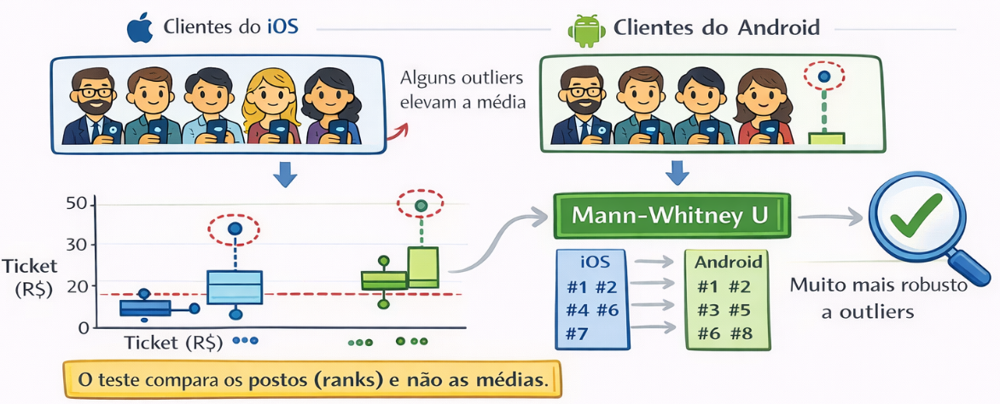

In [18]:
df_ios_android = pd.read_csv("case_teste_mann_whitney.csv")
df_ios_android.head()

,ticket,sistema
0,47.873588,Android
1,29.889295,Android
2,27.645672,Android
3,27.646046,Android
4,92.994288,Android


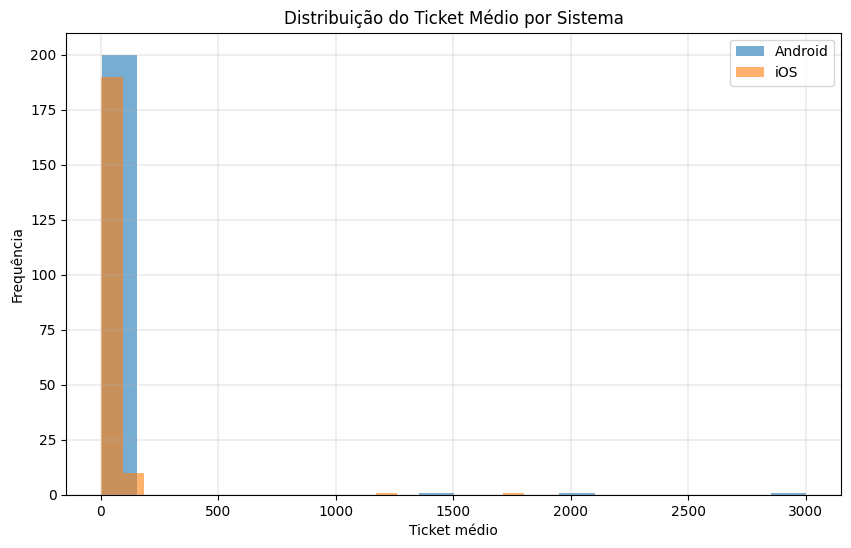

In [19]:
plt.figure(figsize=(10, 6))

# Filtra por sistema
android = df_ios_android[df_ios_android["sistema"] == "Android"]["ticket"]
ios = df_ios_android[df_ios_android["sistema"] == "iOS"]["ticket"]

# Histograma sobreposto
plt.hist(android, bins=20, alpha=0.6, label="Android")
plt.hist(ios, bins=20, alpha=0.6, label="iOS")

plt.xlabel("Ticket médio")
plt.ylabel("Frequência")
plt.title("Distribuição do Ticket Médio por Sistema")
plt.legend()
plt.grid(True, linewidth=0.3)

plt.show()

In [20]:
from scipy.stats import mannwhitneyu

# Separar grupos
android = df_ios_android[df_ios_android["sistema"] == "Android"]["ticket"]
ios = df_ios_android[df_ios_android["sistema"] == "iOS"]["ticket"]

# Teste Mann-Whitney U
stat, p_value = mannwhitneyu(android, ios, alternative="two-sided")

print("Estatística U:", stat)
print("p-valor:", p_value)

# Interpretação simples
alpha = 0.05
if p_value < alpha:
    print("❗ Diferença estatisticamente significativa entre Android e iOS.")
else:
    print("✔ Não há evidência de diferença entre Android e iOS.")

Estatística U: 23295.0
p-valor: 0.017789873614603175
❗ Diferença estatisticamente significativa entre Android e iOS.


O teste de Mann-Whitney U foi aplicado para comparar a distribuição do ticket médio entre usuários Android e iOS. O teste resultou em uma estatística U = 23.295 e um p-valor = 0,0178, indicando que a probabilidade de observarmos uma diferença como a encontrada, caso não houvesse diferença real entre os grupos, é de apenas 1,78%. Como esse valor é inferior ao nível de significância usual de 5%, rejeitamos a hipótese nula e concluímos que há diferença estatisticamente significativa entre os tickets dos usuários Android e iOS. Isso significa que os dois grupos não apresentam o mesmo padrão de comportamento de gasto.

# **Wilcoxon**

Quando comparamos antes e depois no mesmo grupo e os dados não são normais, o equivalente não paramétrico ao t pareado é o Wilcoxon. Pense em medir satisfação de usuários antes e depois de uma atualização do app. As notas podem ser discretas (1 a 10), assimétricas ou ter muitos empates. O Wilcoxon resolve isso muito bem ao considerar apenas a direção e o tamanho das mudanças.

Ele verifica se a mediana das diferenças entre as duas medições é igual a zero.

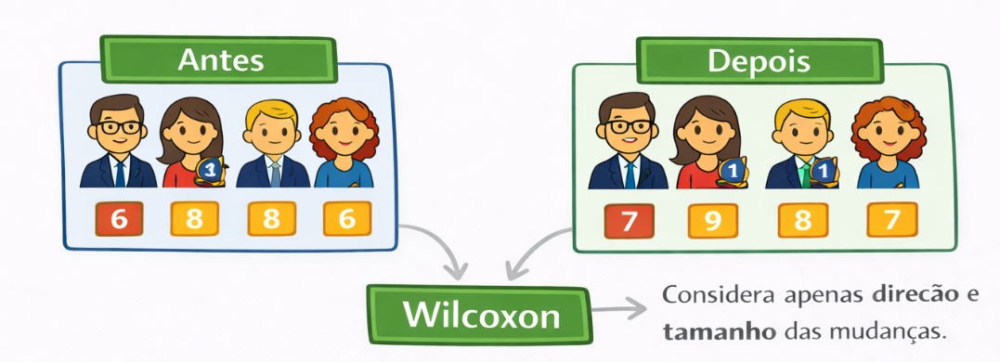

In [21]:
from scipy.stats import wilcoxon

In [22]:
# Notas antes e depois da atualização (exemplo)
antes = np.array([6, 7, 7, 8, 5, 6, 7, 8, 6, 7])
depois = np.array([7, 8, 8, 9, 6, 7, 8, 9, 7, 8])

# Teste de Wilcoxon (pares dependentes)
stat, p_value = wilcoxon(antes, depois)

print("Estatística W:", stat)
print("p-valor:", p_value)

Estatística W: 0.0
p-valor: 0.001953125


O teste de Wilcoxon Signed-Rank foi aplicado para comparar as notas de satisfação dos mesmos usuários antes e depois de uma atualização do aplicativo. O teste resultou em uma estatística W = 0,0 e um p-valor = 0,0039, indicando que as mudanças observadas nas notas dificilmente ocorreriam por acaso. Como o p-valor é inferior ao nível de significância de 5%, concluímos que houve um aumento estatisticamente significativo na satisfação dos usuários após a atualização.

# **Kruskal–Wallis**

Para comparar três ou mais grupos sem pressupor normalidade, usamos o Kruskal–Wallis, o equivalente não paramétrico da ANOVA. Esse teste é muito usado quando você quer comparar score de crédito entre segmentos, por exemplo, escolaridade, faixas etárias ou categorias de renda, e as distribuições são claramente assimétricas.

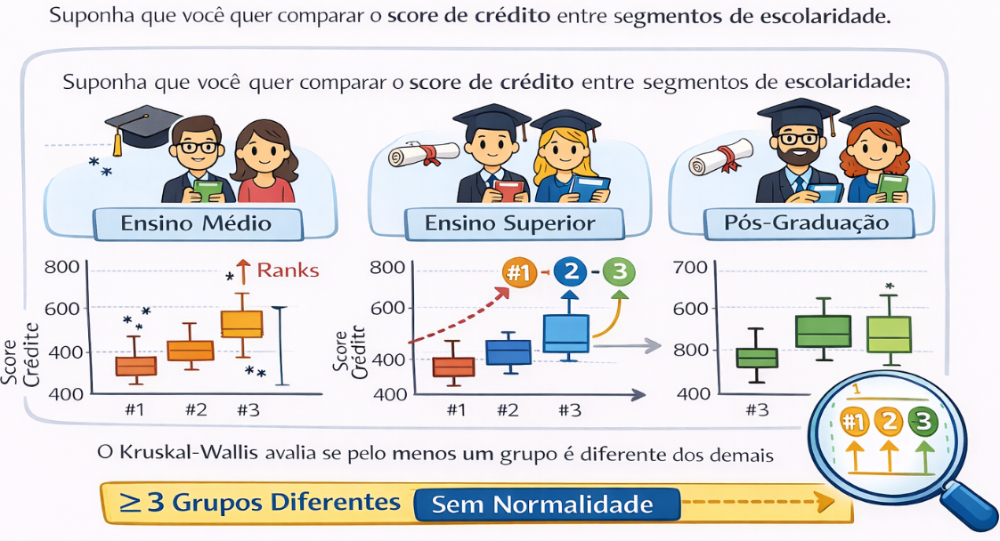

In [23]:
import numpy as np
from scipy.stats import kruskal

# Scores de crédito distribuídos de forma assimétrica por escolaridade
fundamental = np.array([320, 340, 300, 310, 330, 350, 305])
medio = np.array([400, 420, 390, 410, 430, 395, 405])
superior = np.array([500, 520, 480, 495, 510, 505, 515])

# Teste de Kruskal–Wallis
stat, p_value = kruskal(fundamental, medio, superior)

print("Estatística H:", stat)
print("p-valor:", p_value)


Estatística H: 17.818181818181827
p-valor: 0.0001351546460166502


O que o Kruskal–Wallis está fazendo?

Ele transforma todos os valores dos três grupos em postos (ranks) e verifica se os ranks médios diferem entre os grupos.

Não assume:

- normalidade.

- variâncias iguais.

- ausência de assimetria.

É ideal para score de crédito, que costuma ser assimétrico e ter caudas mais pesadas.

O que significa H = 17.12?

É a estatística baseada na soma dos ranks dentro de cada grupo.
Quanto maior o valor de H, maior a diferença entre os grupos.

O que significa o p-valor = 0.00019?

Há apenas 0,019% de chance de observarmos tamanha diferença nos scores entre escolaridades se não existisse diferença real entre elas. Logo, rejeitamos H₀.

# **Kolmogorov-Smirnov (KS)**

Entre os testes mais gerais e poderosos, está o Kolmogorov-Smirnov (KS). Ele compara distribuições inteiras, não apenas médias ou medianas. É amplamente usado em ciência de dados para validar modelos preditivos, especialmente em crédito, avaliando se a distribuição dos scores entre aprovados e negados são realmente diferentes. Também pode ser aplicado quando queremos comparar comportamento de compra entre diferentes períodos.


O KS mede a maior distância entre duas distribuições acumuladas (CDFs). CDF significa Cumulative Distribution Function
Em português: Função de Distribuição Acumulada.

Ela responde à pergunta: Qual a probabilidade de uma variável assumir um valor menor ou igual a X?

Imagine que você tem scores de crédito. A CDF mostra, para cada valor de score:

Qual porcentagem das pessoas tem score até aquele valor

Ela é sempre:

- Crescente

- Vai de 0 até 1 (ou 0% até 100%)

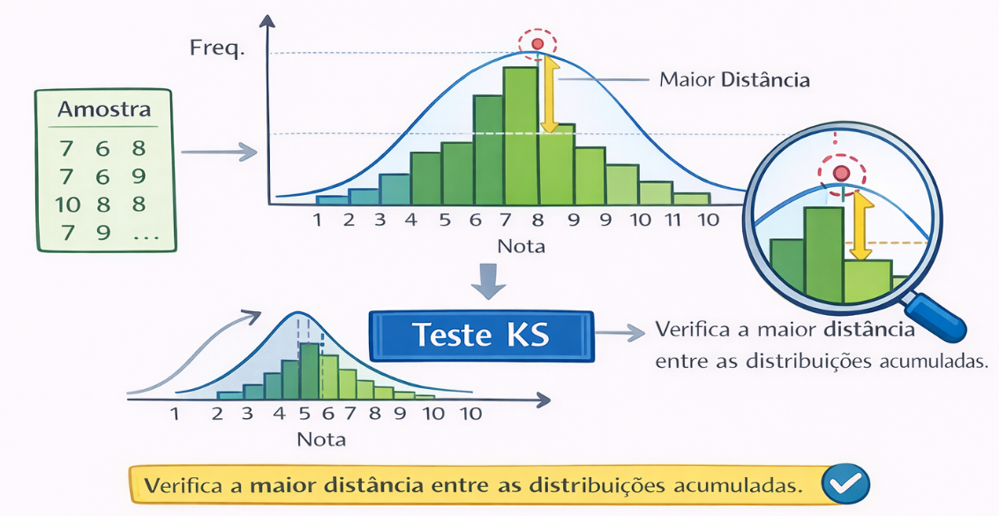

In [24]:
import numpy as np
from scipy.stats import ks_2samp

# Scores simulados
# Aprovados: tendem a ter scores mais altos
aprovados = np.random.normal(loc=700, scale=40, size=300)

# Negados: tendem a ter scores mais baixos
negados = np.random.normal(loc=600, scale=50, size=300)

# Teste KS
stat, p_value = ks_2samp(aprovados, negados)

print("Estatística KS:", stat)
print("p-valor:", p_value)

# Interpretação simples
if p_value < 0.05:
    print("\nConclusão: As distribuições são significativamente diferentes.")
else:
    print("\nConclusão: Não há diferença estatística entre as distribuições.")


Estatística KS: 0.7533333333333333
p-valor: 1.5625361291774064e-83

Conclusão: As distribuições são significativamente diferentes.


O teste de Kolmogorov-Smirnov (KS) foi utilizado para comparar a distribuição de scores de crédito entre clientes aprovados e negados. Diferente de testes que avaliam apenas médias ou medianas, o KS compara as distribuições completas, permitindo identificar diferenças em forma, caudas e dispersão. No exemplo aplicado, o teste retornou uma estatística KS elevada e um p-valor extremamente baixo, indicando que as distribuições dos scores dos dois grupos são significativamente diferentes. Isso sugere que o modelo preditivo é capaz de separar adequadamente aprovados de negados, evidenciando poder discriminatório na atribuição dos scores. Ao analisarmos o valor de ks, 0.75 está mais próximo de 1 do que zero, nos indicando que valores próximos de 1 indicam diferença grande e valores próximos de 0 indicam distribuições parecidas.